## Job Change into Data Science Domain prediction using Naive Bayes Classifier 
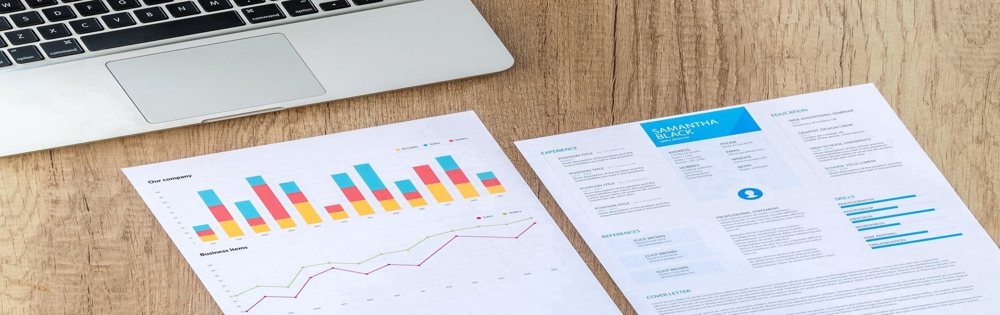

### Problem Statement
- This project is having the potential of answering a very important question which you must be thinking of If you are following my posts.

- This Model can Predict Whether we will get Data Science Job or not with an accuracy of 72% depending on lots of factors which you can see by following the code or the video.

### Data set discription
- Data is collected from https://www.kaggle.com

In [1]:
import numpy as np
import pandas as pd
import missingno as m
import plotly.express as px

# Reading Dataset 

In [2]:
df_train = pd.read_csv('aug_train.csv')
df_test = pd.read_csv('aug_test.csv')

In [3]:
df_train.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,NaN,NaN,1,36,1.0
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0.0
2,11561,city_21,0.624,NaN,No relevent experience,Full time course,Graduate,STEM,5,NaN,NaN,never,83,0.0
3,33241,city_115,0.789,NaN,No relevent experience,NaN,Graduate,Business Degree,<1,NaN,Pvt Ltd,never,52,1.0
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0.0


In [4]:
df_test.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,32403,city_41,0.827,Male,Has relevent experience,Full time course,Graduate,STEM,9,<10,NaN,1,21
1,9858,city_103,0.920,Female,Has relevent experience,no_enrollment,Graduate,STEM,5,NaN,Pvt Ltd,1,98
2,31806,city_21,0.624,Male,No relevent experience,no_enrollment,High School,NaN,<1,NaN,Pvt Ltd,never,15
3,27385,city_13,0.827,Male,Has relevent experience,no_enrollment,Masters,STEM,11,10/49,Pvt Ltd,1,39
4,27724,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,10000+,Pvt Ltd,>4,72


In [5]:
df_train.shape

(19158, 14)

In [6]:
df_test.shape

(2129, 13)

In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   enrollee_id             19158 non-null  int64  
 1   city                    19158 non-null  object 
 2   city_development_index  19158 non-null  float64
 3   gender                  14650 non-null  object 
 4   relevent_experience     19158 non-null  object 
 5   enrolled_university     18772 non-null  object 
 6   education_level         18698 non-null  object 
 7   major_discipline        16345 non-null  object 
 8   experience              19093 non-null  object 
 9   company_size            13220 non-null  object 
 10  company_type            13018 non-null  object 
 11  last_new_job            18735 non-null  object 
 12  training_hours          19158 non-null  int64  
 13  target                  19158 non-null  float64
dtypes: float64(2), int64(2), object(10)
me

In [8]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2129 entries, 0 to 2128
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   enrollee_id             2129 non-null   int64  
 1   city                    2129 non-null   object 
 2   city_development_index  2129 non-null   float64
 3   gender                  1621 non-null   object 
 4   relevent_experience     2129 non-null   object 
 5   enrolled_university     2098 non-null   object 
 6   education_level         2077 non-null   object 
 7   major_discipline        1817 non-null   object 
 8   experience              2124 non-null   object 
 9   company_size            1507 non-null   object 
 10  company_type            1495 non-null   object 
 11  last_new_job            2089 non-null   object 
 12  training_hours          2129 non-null   int64  
dtypes: float64(1), int64(2), object(10)
memory usage: 216.4+ KB


In [9]:
df_train.describe()

,enrollee_id,city_development_index,training_hours,target
count,19158.000000,19158.000000,19158.000000,19158.000000
mean,16875.358179,0.828848,65.366896,0.249348
std,9616.292592,0.123362,60.058462,0.432647
min,1.000000,0.448000,1.000000,0.000000
25%,8554.250000,0.740000,23.000000,0.000000
50%,16982.500000,0.903000,47.000000,0.000000
75%,25169.750000,0.920000,88.000000,0.000000
max,33380.000000,0.949000,336.000000,1.000000


In [10]:
df_test.describe()

,enrollee_id,city_development_index,training_hours
count,2129.000000,2129.000000,2129.000000
mean,16861.614843,0.824984,64.983091
std,9576.846029,0.125074,60.238660
min,3.000000,0.448000,1.000000
25%,8562.000000,0.698000,23.000000
50%,16816.000000,0.903000,47.000000
75%,25129.000000,0.920000,86.000000
max,33353.000000,0.949000,334.000000


# Data Cleaning

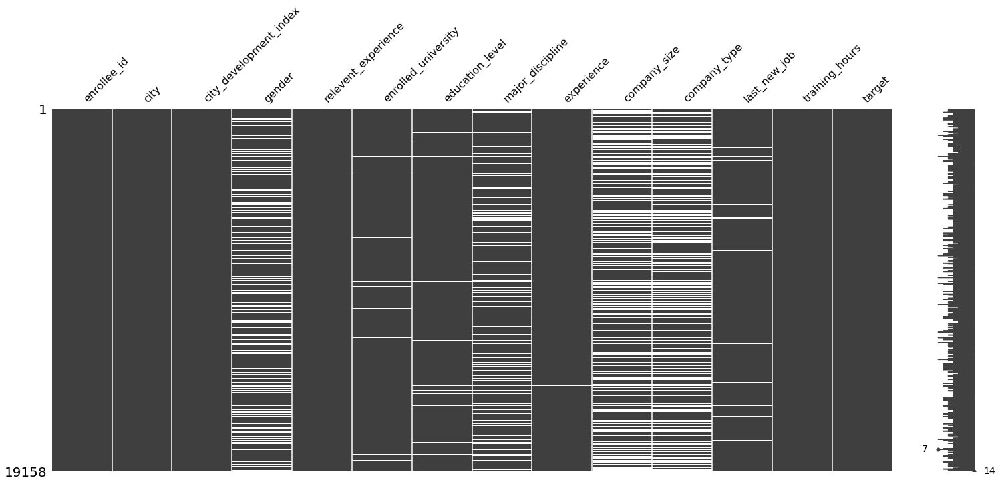

In [11]:
m.matrix(df_train)

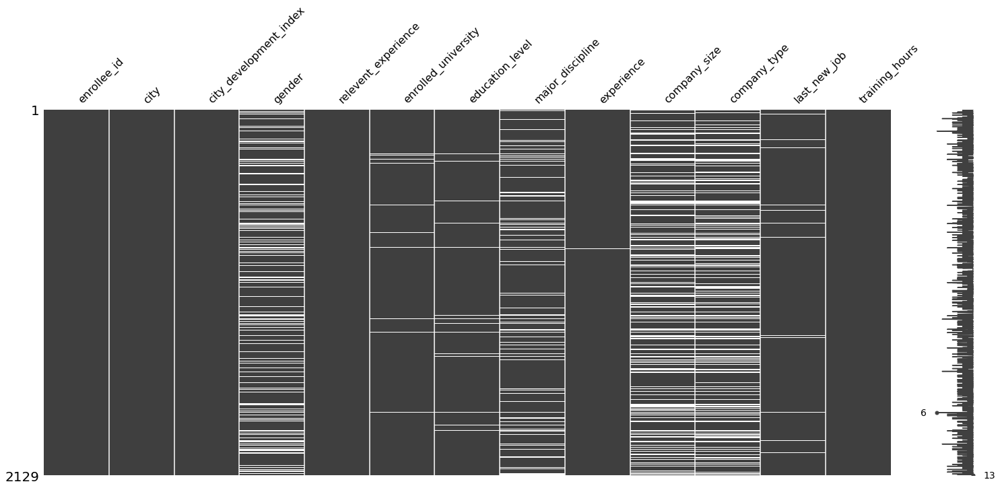

In [12]:
m.matrix(df_test)

In [13]:
df_train.isnull().sum()

enrollee_id                  0
city                         0
city_development_index       0
gender                    4508
relevent_experience          0
enrolled_university        386
education_level            460
major_discipline          2813
experience                  65
company_size              5938
company_type              6140
last_new_job               423
training_hours               0
target                       0
dtype: int64

### Putting 'Not_Specified' in empty columns of gender 

In [14]:
df_train['gender'] = df_train['gender'].fillna('Not_Specified')
df_test['gender'] = df_test['gender'].fillna('Not_Specified')

### Putting 'Other' in empty columns of major_discipline

In [15]:
df_train['major_discipline'] = df_train['major_discipline'].fillna('Other')
df_test['major_discipline'] = df_test['major_discipline'].fillna('Other')

###  Putting 'Not_Specified' in empty columns of company size

In [16]:
df_train['company_size'] = df_train['company_size'].fillna('Not_Specified')
df_test['company_size'] = df_test['company_size'].fillna('Not_Specified')

### Putting 'Other' in empty columns of company type

In [17]:
df_train['company_type'] = df_train['company_type'].fillna('Other')
df_test['company_type'] = df_test['company_type'].fillna('Other')

### Dropping rest of the emply columns data

In [18]:
df_train = df_train.dropna()
df_test = df_test.dropna()

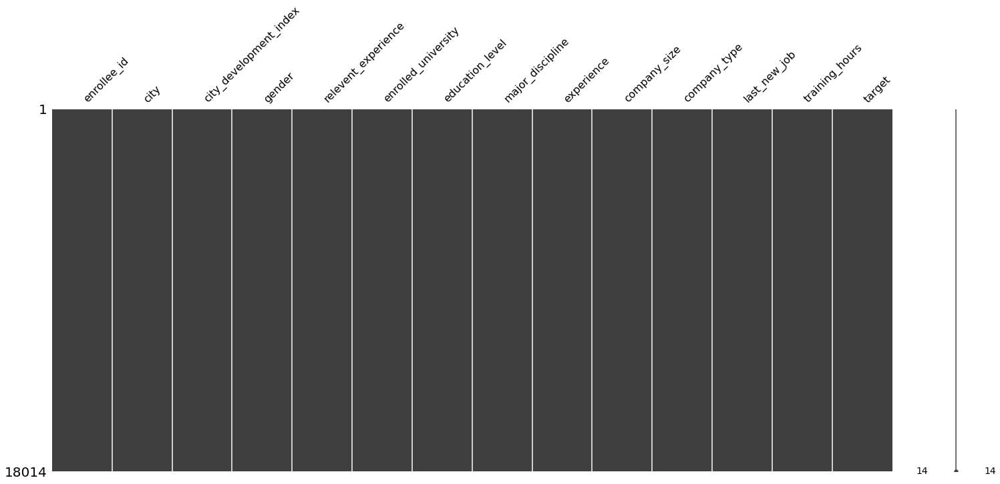

In [19]:
m.matrix(df_train)

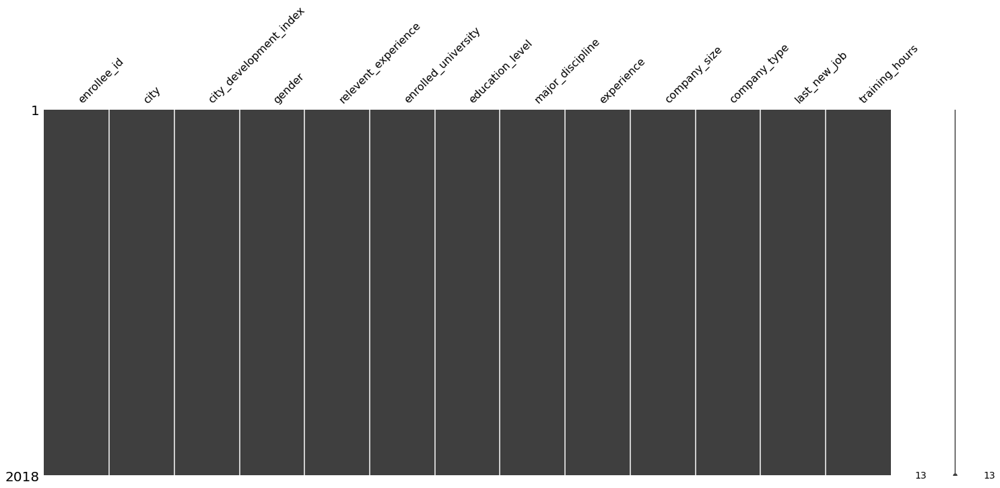

In [20]:
m.matrix(df_test)

# Data Preprocessing

In [21]:
df_train.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,Not_Specified,Other,1,36,1.0
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0.0
2,11561,city_21,0.624,Not_Specified,No relevent experience,Full time course,Graduate,STEM,5,Not_Specified,Other,never,83,0.0
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0.0
5,21651,city_176,0.764,Not_Specified,Has relevent experience,Part time course,Graduate,STEM,11,Not_Specified,Other,1,24,1.0


In [22]:
df_test.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,32403,city_41,0.827,Male,Has relevent experience,Full time course,Graduate,STEM,9,<10,Other,1,21
1,9858,city_103,0.920,Female,Has relevent experience,no_enrollment,Graduate,STEM,5,Not_Specified,Pvt Ltd,1,98
2,31806,city_21,0.624,Male,No relevent experience,no_enrollment,High School,Other,<1,Not_Specified,Pvt Ltd,never,15
3,27385,city_13,0.827,Male,Has relevent experience,no_enrollment,Masters,STEM,11,10/49,Pvt Ltd,1,39
4,27724,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,10000+,Pvt Ltd,>4,72


### Removing '<' and '>' from experience column

In [23]:
df_train['experience'] = df_train['experience'].str.replace('<', '').str.replace('>', '').str.strip()
df_test['experience'] = df_test['experience'].str.replace('<', '').str.replace('>', '').str.strip()

### Putting 6 in the place of '>4' in last new job column 

In [24]:
df_train['last_new_job'] = df_train['last_new_job'].str.replace('>4', '6').str.replace('never', '0').str.strip()
df_test['last_new_job'] = df_test['last_new_job'].str.replace('>4', '6').str.replace('never', '0').str.strip()


### Placing the value of company size column in categories

In [25]:
df_train['company_size'] = df_train['company_size'].str.replace('<10', 'Nano').str.strip()
df_train['company_size'] = df_train['company_size'].str.replace('10/49', 'Micro').str.strip()
df_train['company_size'] = df_train['company_size'].str.replace('50-99', 'Mini').str.strip()
df_train['company_size'] = df_train['company_size'].str.replace('100-500', 'Descent').str.strip()
df_train['company_size'] = df_train['company_size'].str.replace('500-999', 'Big').str.strip()
df_train['company_size'] = df_train['company_size'].str.replace('1000-4999', 'Immense').str.strip()
df_train['company_size'] = df_train['company_size'].str.replace('5000-9999', 'Massive').str.strip()
df_train['company_size'] = df_train['company_size'].str.replace('10000+', 'Huge').str.strip()

df_test['company_size'] = df_test['company_size'].str.replace('<10', 'Nano').str.strip()
df_test['company_size'] = df_test['company_size'].str.replace('10/49', 'Micro').str.strip()
df_test['company_size'] = df_test['company_size'].str.replace('50-99', 'Mini').str.strip()
df_test['company_size'] = df_test['company_size'].str.replace('100-500', 'Descent').str.strip()
df_test['company_size'] = df_test['company_size'].str.replace('500-999', 'Big').str.strip()
df_test['company_size'] = df_test['company_size'].str.replace('1000-4999', 'Immense').str.strip()
df_test['company_size'] = df_test['company_size'].str.replace('5000-9999', 'Massive').str.strip()
df_test['company_size'] = df_test['company_size'].str.replace('10000+', 'Huge').str.strip()


<ipython-input-25-bc2909716dee>:8: FutureWarning: The default value of regex will change from True to False in a future version.
  df_train['company_size'] = df_train['company_size'].str.replace('10000+', 'Huge').str.strip()
<ipython-input-25-bc2909716dee>:17: FutureWarning: The default value of regex will change from True to False in a future version.
  df_test['company_size'] = df_test['company_size'].str.replace('10000+', 'Huge').str.strip()


In [26]:
df_train.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,20,Not_Specified,Other,1,36,1.0
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,Mini,Pvt Ltd,6,47,0.0
2,11561,city_21,0.624,Not_Specified,No relevent experience,Full time course,Graduate,STEM,5,Not_Specified,Other,0,83,0.0
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,20,Mini,Funded Startup,4,8,0.0
5,21651,city_176,0.764,Not_Specified,Has relevent experience,Part time course,Graduate,STEM,11,Not_Specified,Other,1,24,1.0


In [27]:
df_test.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,32403,city_41,0.827,Male,Has relevent experience,Full time course,Graduate,STEM,9,Nano,Other,1,21
1,9858,city_103,0.920,Female,Has relevent experience,no_enrollment,Graduate,STEM,5,Not_Specified,Pvt Ltd,1,98
2,31806,city_21,0.624,Male,No relevent experience,no_enrollment,High School,Other,1,Not_Specified,Pvt Ltd,0,15
3,27385,city_13,0.827,Male,Has relevent experience,no_enrollment,Masters,STEM,11,Micro,Pvt Ltd,1,39
4,27724,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,20,Huge+,Pvt Ltd,6,72


# Univariate, Bivariate and Multivariate Analysis

In [28]:
fig = px.histogram(df_train, x="target")
fig.show()

### For Training set

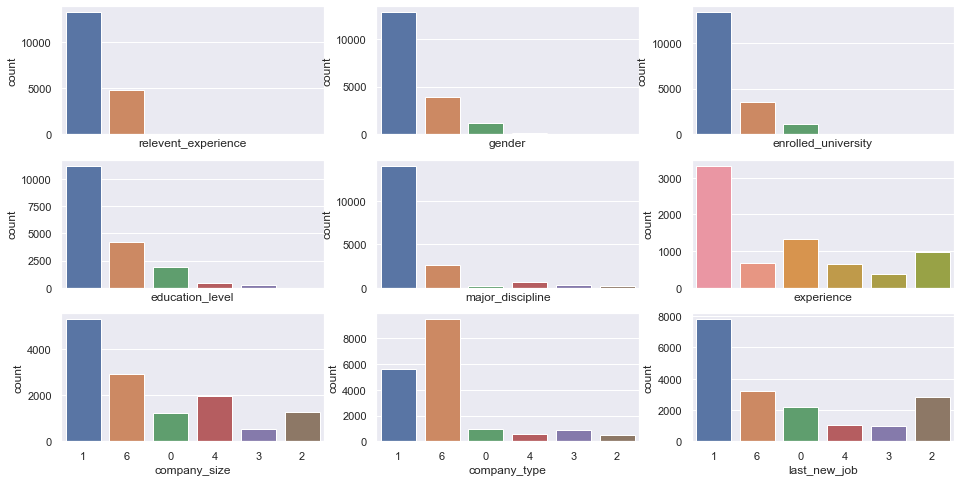

In [29]:
import seaborn as sns
from matplotlib import pyplot as plt
sns.set_theme(style="darkgrid")
fig, axes = plt.subplots(3, 3, sharex=True, figsize=(16,8))
sns.countplot(ax=axes[0,0],x='relevent_experience',data = df_train)
sns.countplot(ax=axes[0,1],x='gender',data = df_train)
sns.countplot(ax=axes[0,2],x='enrolled_university',data = df_train)
sns.countplot(ax=axes[1,0],x='education_level',data = df_train)
sns.countplot(ax=axes[1,1],x='major_discipline',data = df_train)
sns.countplot(ax=axes[1,2],x='experience',data = df_train)
sns.countplot(ax=axes[2,0],x='company_size',data = df_train)
sns.countplot(ax=axes[2,1],x='company_type',data = df_train)
sns.countplot(ax=axes[2,2],x='last_new_job',data = df_train)


### For Prediction Set

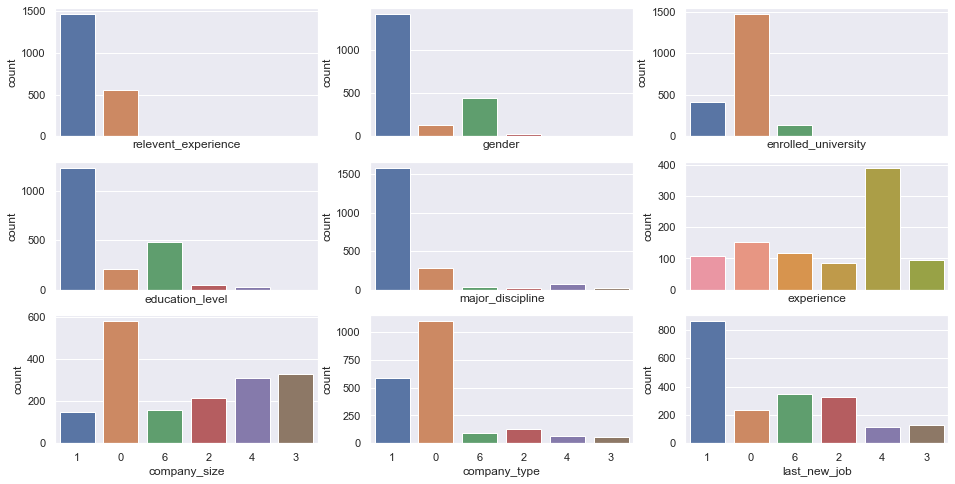

In [30]:
sns.set_theme(style="darkgrid")
fig, axes = plt.subplots(3, 3, sharex=True, figsize=(16,8))
sns.countplot(ax=axes[0,0],x='relevent_experience',data = df_test)
sns.countplot(ax=axes[0,1],x='gender',data = df_test)
sns.countplot(ax=axes[0,2],x='enrolled_university',data = df_test)
sns.countplot(ax=axes[1,0],x='education_level',data = df_test)
sns.countplot(ax=axes[1,1],x='major_discipline',data = df_test)
sns.countplot(ax=axes[1,2],x='experience',data = df_test)
sns.countplot(ax=axes[2,0],x='company_size',data = df_test)
sns.countplot(ax=axes[2,1],x='company_type',data = df_test)
sns.countplot(ax=axes[2,2],x='last_new_job',data = df_test)

In [31]:

fig = px.violin(df_train, x="relevent_experience",y='training_hours',title='Relavent Experience with Training Hours',points='all',box=True)
fig.show()

In [32]:
fig = px.box(df_train, x="experience",y='training_hours',title='Experience and Training Hours with Target',color='target')
fig.show()

In [33]:
df_train

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,20,Not_Specified,Other,1,36,1.0
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,Mini,Pvt Ltd,6,47,0.0
2,11561,city_21,0.624,Not_Specified,No relevent experience,Full time course,Graduate,STEM,5,Not_Specified,Other,0,83,0.0
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,20,Mini,Funded Startup,4,8,0.0
5,21651,city_176,0.764,Not_Specified,Has relevent experience,Part time course,Graduate,STEM,11,Not_Specified,Other,1,24,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19153,7386,city_173,0.878,Male,No relevent experience,no_enrollment,Graduate,Humanities,14,Not_Specified,Other,1,42,1.0
19154,31398,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,14,Not_Specified,Other,4,52,1.0
19155,24576,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,20,Mini,Pvt Ltd,4,44,0.0
19156,5756,city_65,0.802,Male,Has relevent experience,no_enrollment,High School,Other,1,Big,Pvt Ltd,2,97,0.0


In [34]:
fig = px.histogram(df_train, x="gender",y='city_development_index',title='Target with Gender and City Development ',color='target')
fig.show()

In [35]:
fig = px.scatter(df_train, x="major_discipline",y='city_development_index',title='Target with Major discipline and City Development ',color='target')
fig.show()

In [36]:
fig = px.box(y=df_train['relevent_experience'], x= df_train['major_discipline'],color=df_train['target'],
            title='Experience in Major Subject')
fig.update_xaxes(type='category')
fig.show()

# Dropping Useless Column

In [37]:
df_train = df_train.drop(columns=['enrollee_id','city','city_development_index'])
df_test = df_test.drop(columns=['enrollee_id','city','city_development_index'])

In [38]:
df_train.columns

Index(['gender', 'relevent_experience', 'enrolled_university',
       'education_level', 'major_discipline', 'experience', 'company_size',
       'company_type', 'last_new_job', 'training_hours', 'target'],
      dtype='object')

# Using Label Encoder for Categorical Variable 

In [39]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df_train['gender'] = le.fit_transform(df_train['gender'])
df_train['relevent_experience'] = le.fit_transform(df_train['relevent_experience'])
df_train['enrolled_university'] = le.fit_transform(df_train['enrolled_university'])
df_train['education_level'] = le.fit_transform(df_train['education_level'])
df_train['major_discipline'] = le.fit_transform(df_train['major_discipline'])
df_train['company_size'] = le.fit_transform(df_train['company_size'])
df_train['company_type'] = le.fit_transform(df_train['company_type'])

df_test['gender'] = le.fit_transform(df_test['gender'])
df_test['relevent_experience'] = le.fit_transform(df_test['relevent_experience'])
df_test['enrolled_university'] = le.fit_transform(df_test['enrolled_university'])
df_test['education_level'] = le.fit_transform(df_test['education_level'])
df_test['major_discipline'] = le.fit_transform(df_test['major_discipline'])
df_test['company_size'] = le.fit_transform(df_test['company_size'])
df_test['company_type'] = le.fit_transform(df_test['company_type'])

# Heatmap

### For Training Data 

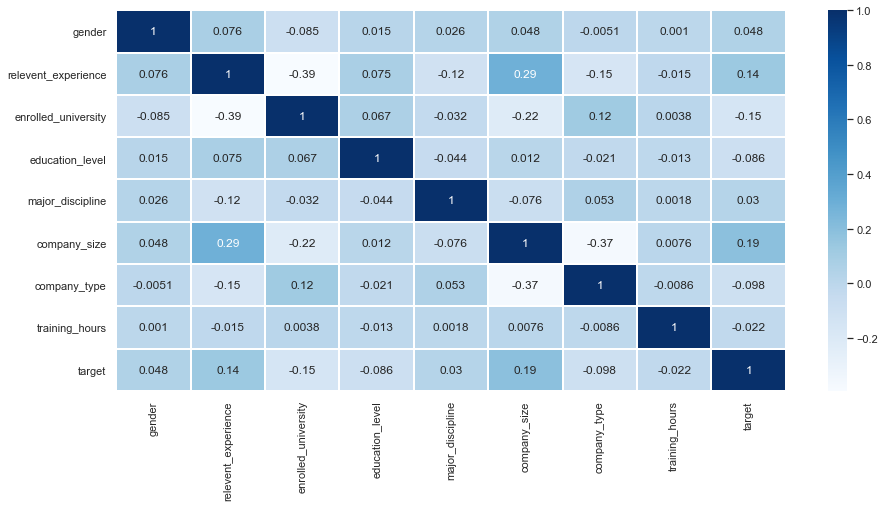

In [40]:
plt.subplots(figsize=(15,7))
sns.heatmap(df_train.corr(),annot=True,linewidth=1,cmap='Blues')

### For Test Data 

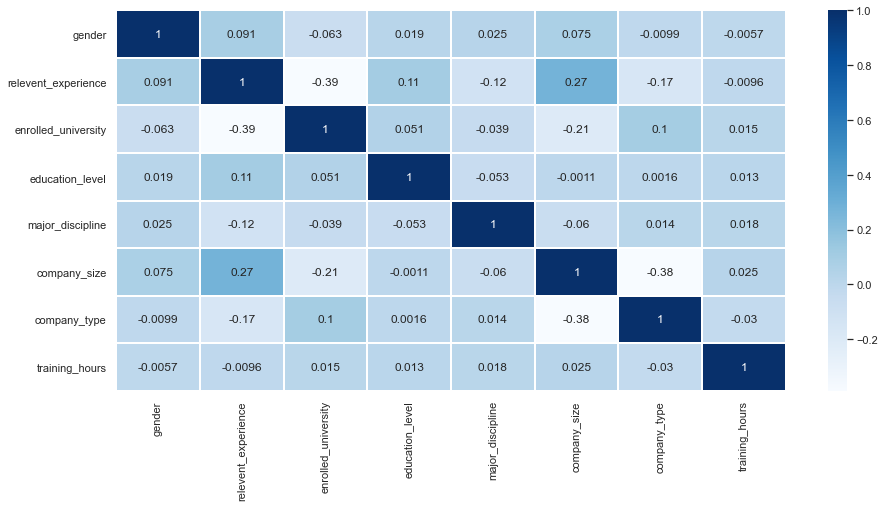

In [41]:
plt.subplots(figsize=(15,7))
sns.heatmap(df_test.corr(),annot=True,linewidth=1,cmap='Blues')

In [42]:
df_train.head()

,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,1,0,2,0,5,20,8,3,1,36,1.0
1,1,1,2,0,5,15,6,5,6,47,0.0
2,2,1,0,0,5,5,8,3,0,83,0.0
4,1,0,2,2,5,20,6,1,4,8,0.0
5,2,0,1,0,5,11,8,3,1,24,1.0


In [43]:
df_test.head()

,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,1,0,0,0,5,9,7,3,1,21
1,0,0,2,0,5,5,8,5,1,98
2,1,1,2,1,4,1,8,5,0,15
3,1,0,2,2,5,11,5,5,1,39
4,1,0,2,0,5,20,2,5,6,72


In [44]:
df = df_train

# X and y Split

In [45]:
y=df.pop('target')
X=df

In [46]:
X

,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,1,0,2,0,5,20,8,3,1,36
1,1,1,2,0,5,15,6,5,6,47
2,2,1,0,0,5,5,8,3,0,83
4,1,0,2,2,5,20,6,1,4,8
5,2,0,1,0,5,11,8,3,1,24
...,...,...,...,...,...,...,...,...,...,...
19153,1,1,2,0,2,14,8,3,1,42
19154,1,0,2,0,5,14,8,3,4,52
19155,1,0,2,0,5,20,6,5,4,44
19156,1,0,2,1,4,1,0,5,2,97


In [47]:
y

0        1.0
1        0.0
2        0.0
4        0.0
5        1.0
        ... 
19153    1.0
19154    1.0
19155    0.0
19156    0.0
19157    0.0
Name: target, Length: 18014, dtype: float64

# Train Test Split 

In [48]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [49]:
y=y.values
y = y.reshape(len(y),1)

# Feature Scaling

In [50]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Naive Bayes Classifier

In [51]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_train, y_train)

GaussianNB()

In [52]:
y_test=y_test.values

# Prediction

In [53]:
y_pred = classifier.predict(X_test)

print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0. 0.]
 [0. 0.]
 [0. 0.]
 ...
 [0. 0.]
 [0. 1.]
 [0. 0.]]


# Confusion Matrix

In [54]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)


[[2878  526]
 [ 707  393]]


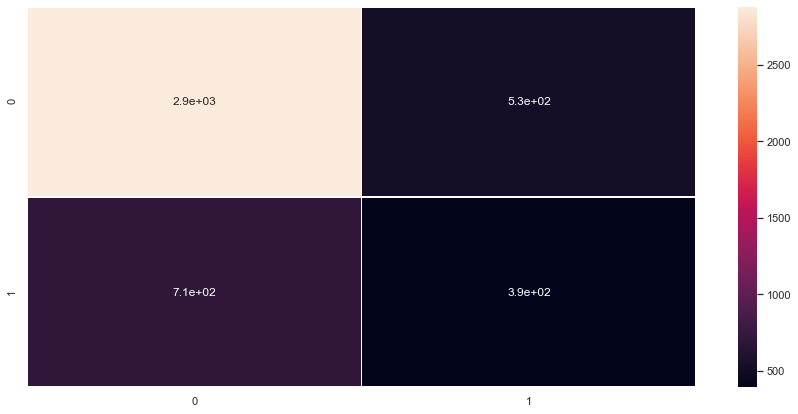

In [55]:
plt.subplots(figsize=(15,7))
sns.heatmap(cm,annot=True,linewidth=1)

# Accuracy

In [56]:
print("Accuracy Score : ",accuracy_score(y_test, y_pred))

Accuracy Score :  0.7262433392539964


In [57]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.80      0.85      0.82      3404
         1.0       0.43      0.36      0.39      1100

    accuracy                           0.73      4504
   macro avg       0.62      0.60      0.61      4504
weighted avg       0.71      0.73      0.72      4504



# Prediction for Given Test Dataset

In [58]:
new_pred = classifier.predict(df_test)
print(new_pred)

[0. 0. 0. ... 0. 0. 0.]


In [59]:
new_pred = new_pred.reshape(len(new_pred),1)

In [60]:
new_pred

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

In [61]:
df_test

,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,1,0,0,0,5,9,7,3,1,21
1,0,0,2,0,5,5,8,5,1,98
2,1,1,2,1,4,1,8,5,0,15
3,1,0,2,2,5,11,5,5,1,39
4,1,0,2,0,5,20,2,5,6,72
...,...,...,...,...,...,...,...,...,...,...
2124,1,1,2,0,2,16,8,4,4,15
2125,1,0,2,2,5,18,8,3,2,30
2126,1,1,2,4,4,3,8,5,0,18
2127,1,0,0,1,4,7,1,4,1,84


In [62]:
dataset = pd.DataFrame({'Data_Scientist Prediction': new_pred[:, 0]})
dataset.to_csv('dataset.csv')
dataset

,Data_Scientist Prediction
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
2013,0.0
2014,0.0
2015,0.0
2016,0.0


# This Model can Predict Whether a Person will get Data Science Job or not with an Accuracy of 72%